We are going to work in the mark of Senegal

In [11]:
senegal_coordinates = (-17.535, 12.332, -11.345, 16.691)


In [ ]:
#Create image landcover.tif
from Connect_Klab import main as connect_klab
i=2008
connect_klab(senegal_coordinates[0],senegal_coordinates[1],senegal_coordinates[2],senegal_coordinates[3],i, 'landcover_'+str(i),'landcover:LandCoverType')

- try Remote Engine connection ....
* connection to http://127.0.0.1:8283/modeler was successfully established. session: s6ypr8vz1ik
landcover:LandCoverType dataset successfully retrieved. File saved: landcover_2008.tif
El final


reque


Task exception was never retrieved
future: <Task finished name='Task-8' coro=<ARIES_request() done, defined at c:\Users\glode\OneDrive\Desktop\practicas\prueba\Connect_Klab.py:13> exception=AttributeError("'NoneType' object has no attribute 'exportToFile'")>
Traceback (most recent call last):
  File "c:\Users\glode\OneDrive\Desktop\practicas\prueba\Connect_Klab.py", line 40, in ARIES_request
    data.exportToFile(Export.DATA, export_format, export_path)
AttributeError: 'NoneType' object has no attribute 'exportToFile'


reque


Task exception was never retrieved
future: <Task finished name='Task-9' coro=<ARIES_request() done, defined at c:\Users\glode\OneDrive\Desktop\practicas\prueba\Connect_Klab.py:13> exception=AttributeError("'NoneType' object has no attribute 'exportToFile'")>
Traceback (most recent call last):
  File "c:\Users\glode\OneDrive\Desktop\practicas\prueba\Connect_Klab.py", line 40, in ARIES_request
    data.exportToFile(Export.DATA, export_format, export_path)
AttributeError: 'NoneType' object has no attribute 'exportToFile'
Task exception was never retrieved
future: <Task finished name='Task-15' coro=<ARIES_request() done, defined at c:\Users\glode\OneDrive\Desktop\practicas\prueba\Connect_Klab.py:13> exception=AttributeError("'NoneType' object has no attribute 'exportToFile'")>
Traceback (most recent call last):
  File "c:\Users\glode\OneDrive\Desktop\practicas\prueba\Connect_Klab.py", line 40, in ARIES_request
    data.exportToFile(Export.DATA, export_format, export_path)
AttributeError: '

reque
reque


Task exception was never retrieved
future: <Task finished name='Task-11' coro=<ARIES_request() done, defined at c:\Users\glode\OneDrive\Desktop\practicas\prueba\Connect_Klab.py:13> exception=AttributeError("'NoneType' object has no attribute 'exportToFile'")>
Traceback (most recent call last):
  File "c:\Users\glode\OneDrive\Desktop\practicas\prueba\Connect_Klab.py", line 40, in ARIES_request
    data.exportToFile(Export.DATA, export_format, export_path)
AttributeError: 'NoneType' object has no attribute 'exportToFile'


reque


In [2]:
import rasterio
from rasterio.plot import show, show_hist
from matplotlib import pyplot
import numpy as np

importamos los inputs, el primero será NDVI(normalized difference vegetation index)

In [8]:
from Connect_Klab import main as connect_klab
i=2010
connect_klab(senegal_coordinates[0],senegal_coordinates[1],senegal_coordinates[2],senegal_coordinates[3],i, 'NDVI/NDVI_'+str(i),'ecology:NormalizedDifferenceVegetationIndex')

- try Remote Engine connection ....
* connection to http://127.0.0.1:8283/modeler was successfully established. session: s3lp75ov0k4
ecology:NormalizedDifferenceVegetationIndex dataset successfully retrieved. File saved: NDVI\NDVI_2010.tif
El final


reque


In [12]:
from Connect_Klab import main as connect_klab
i=2010
connect_klab(senegal_coordinates[0],senegal_coordinates[1],senegal_coordinates[2],senegal_coordinates[3],i, 'drought/drought_severity'+str(i),'soil:DroughtSeverity')

- try Remote Engine connection ....
* connection to http://127.0.0.1:8283/modeler was successfully established. session: s3lp75ov0k4
soil:DroughtSeverity dataset successfully retrieved. File saved: drought\drought_severity2010.tif
El final


reque


In [21]:
#geography:Elevation
from Connect_Klab import main as connect_klab
i=2003
connect_klab(senegal_coordinates[0],senegal_coordinates[1],senegal_coordinates[2],senegal_coordinates[3],i, 'elevation','geography:Elevation')

- try Remote Engine connection ....
* connection to http://127.0.0.1:8283/modeler was successfully established. session: s6ypr8vz1ik
geography:Elevation dataset successfully retrieved. File saved: elevation.tif
El final


reque


save the images in lists

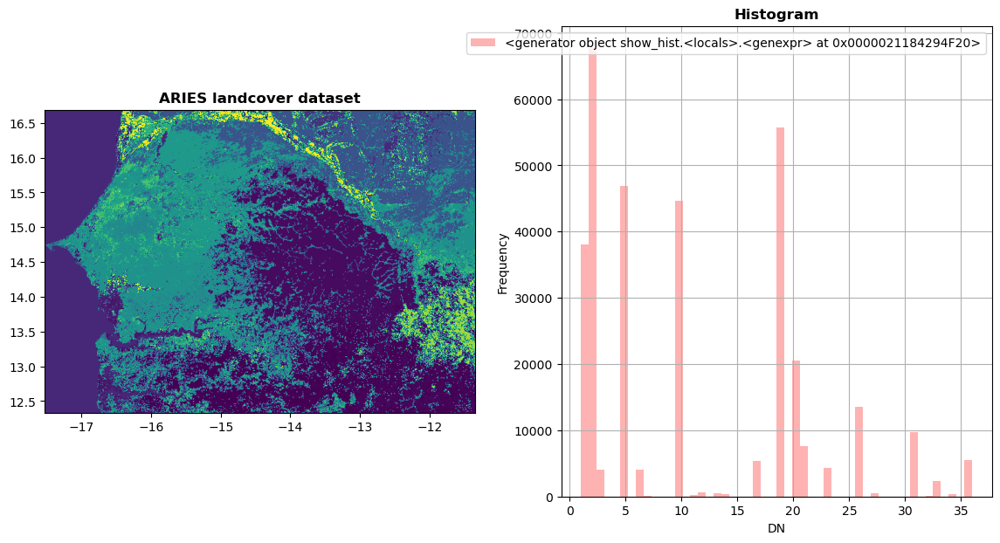

In [34]:
# Show image NDVI
with rasterio.open("landcover/landcover_1992.tif") as src:
    fig, (axrgb, axhist) = pyplot.subplots(1, 2, figsize=(14,7))
    show(src, with_bounds=True, ax=axrgb, title='ARIES landcover dataset')
    show_hist(src, bins=50, lw=0.0, stacked=False, alpha=0.3, histtype='stepfilled', title="Histogram", ax=axhist)

    pyplot.show()

In [3]:
print("start connecting")
modis_stack = []
years=list(range(1992,2011))
for i in years:
        with rasterio.open(f'landcover/landcover_{i}.tif') as src:
            modis_stack.append(src.read())
       # length()
        print(modis_stack[years.index(i)].shape)

start connecting
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)


We change the landcover into five landcover: buit-up, cropland, Forest, Grassland, Waterbodies

In [4]:
print(len(modis_stack))
print(len(years))

19
19


In [4]:
etiqueta=['EvergreenConiferousForest', 'OpenDeciduousBroadleafForest', 'Shrubland', 'Mangrove', 'OpenDeciduousConiferousForest', 'WaterBody', 'BareArea', 'ClosedDecidousBroadleafForest', 'ClosedDeciduousConiferousForest', 'BeachDuneAndSand', 'Grassland', 'OpenSavanna', 'DeciduousBroadleafforest', 'sparseShrubCover', 'artificialSurface', 'OpenEvergreenConiferousForest', 'SparseTreeCover', 'NonIrregatedArableLandHerbaceous', 'closedEvergreenConiferousforest', 'NonIrrigatedArableLand', 'ClosedSavanna', 'AgriculturalLandWithNaturalVegetation', 'evergreeenBroadleadForest', 'PermanentlyIrrigatedArableLand', 'DeciduousConferousForest', 'MixedForest', 'ComplexCultivationPatternedLand', 'InlandSwamp', 'GlacierPerpetualSnow', 'evergreenShrubland', 'LichenMoss', 'DeciduousShrubland', 'BareRock', 'SparseVegetation', 'SparseHerbaceousCover', 'PermanentCropland', 'Wetland']

etiqueta.index("WaterBody")

5

In [5]:
for a in range(len(years)):
    for i in range(483):
        for j in range(689):
            if j<200 and modis_stack[a][0,i,j]==5:
                modis_stack[a][0,i,j]=-30
        

In [6]:
from utilities import change_label
modis_stack=change_label(modis_stack)

37


In [7]:
for a in range(len(years)):
    for i in range(483):
        for j in range(689):
            if modis_stack[a][0,i,j]==-30:
                print("Se queda")

Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
Se queda
S

task: charge the pixels of NDVI, drought, elevation and DSMP(lights)

In [8]:
print("start connecting")
modis_stack_NDVI = []
for j in years:
    with rasterio.open(f'NDVI/NDVI_{j}.tif') as src:
            modis_stack_NDVI.append(src.read())
    print(modis_stack_NDVI[years.index(j)].shape)

start connecting
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)


In [26]:
print("start connecting")
modis_stack_drought = []
for j in years:
     with rasterio.open(f'drought/drought_severity{j}.tif') as src:
            modis_stack_drought.append(src.read())
       # length()
     print(modis_stack_drought[years.index(j)].shape)
print(len(modis_stack_drought))

start connecting
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
19


The elevation doesn't change in 20 years

In [9]:
print("start connecting")
modis_stack_elevation = []
j=0
with rasterio.open(f'elevation.tif') as src:
            modis_stack_elevation=src.read()
       # length()
print(modis_stack_elevation.shape)

start connecting
(1, 483, 689)


In [12]:
from rasterio.windows import from_bounds

modis_stack_DSMP=[]

print("start connecting")
# Ruta al archivo TIF mundial
for i in years:
    ruta_archivo_tif = 'datos_DSMP/DSMP_'+str(i)+'.tif'

# Coordenadas de Senegal (oeste, sur, este, norte)

# Abre el archivo TIF
    with rasterio.open(ruta_archivo_tif) as src:
    # Crea una ventana de recorte basada en las coordenadas de Senegal
        ventana_recorte = from_bounds(*senegal_coordinates, src.transform)

    # Lee la región de interés
        modis_stack_DSMP.append(src.read(window=ventana_recorte))

    print(modis_stack_DSMP[years.index(i)].shape)
print(len(modis_stack_DSMP))

start connecting
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
(1, 483, 689)
19


In [13]:
etiqueta2=['forest', 'cropland', 'grassland', 'waterbody', 'built_up']

there are some pixels that doesn't have changed, it correspond mostly to waterbodies, and that makes sense
we can see it as follows:

In [14]:
total_area=483*689

In [14]:
agua_con_NDVI=0
tierra_sin_NDVI=0
total_NDVI=0
total_agua=0
for i in range(483):
    for j in range(689):
        if modis_stack_NDVI[0][0,i,j]>0 or modis_stack_NDVI[0][0,i,j]<1:
            if modis_stack[years.index(2003)][0,i,j]==4:
                agua_con_NDVI+=1
                total_agua+=1
        else:
            if modis_stack[years.index(2003)][0,i,j]!=4:
                tierra_sin_NDVI+=1
            else:
                total_agua+=1
print("Hay un "+str(agua_con_NDVI*100/total_agua)+"%" +" de agua con NDVI")
print("Hay un "+str(tierra_sin_NDVI*100/(total_area-total_NDVI))+"%"+ " de pixel sin NDVI en tierra")

Hay un 89.46203844558153% de agua con NDVI
Hay un 13.295591474426585% de pixel sin NDVI en tierra


we are only going to apply our method to the terrestrial part

we save in a vector the pixels that doesn't have changed

In [15]:
difference=[]
change_map=[]
for a in range(len(years)-1):
    difference.append(np.abs(modis_stack[a] - modis_stack[a+1]))
    change_map.append(np.where(difference[a] > 0, 1, 0))
print(change_map[0].shape)

(1, 483, 689)


In [16]:
change_total=np.zeros([483,689], dtype=int)
for i in range(483):
    for j in range(689):
        for a in range(len(years)-1):#len(years) because there have been 1 less change than the number of years
            if change_map[a][0,i,j]!=0:
                change_total[i,j]+=1#it's greater than 1 if there is change, it's 0 if there is not change
            

create a list with the positions where it doesn't have changed
we also measure how many points doesn't have changed and we save it in a

In [17]:
change_positions=[]
a=0
for i in range(483):
    for j in range(689):
        if change_total[i,j]==0 and modis_stack[0][0,i,j]!=-30: 
            change_positions.append([i,j])
            #print(change_positions[a])
            a+=1

we measures how many points doesn't have changed

In [18]:
print(len(change_positions))

278422


measures how many points are of each area in year 2003 (we have selected this year because itt is in the middle between 1992 and 2010)

In [19]:
total_terrestrial=0
total_landcover=np.zeros(6, dtype=int)
for i in range(483):
    for j in range(689):
        if modis_stack[years.index(2003)][0,i,j]!=-30:
            total_landcover[modis_stack[years.index(2003)][0,i,j]]+=1
            total_terrestrial+=1
            

Porcentaje of each area

In [20]:
porcentaje_landcover=[x / (total_terrestrial) * 100 for x in total_landcover]

In [21]:
print(total_landcover)
print(porcentaje_landcover)

[     0  44318  88523 146220   7231    568]
[0.0, 15.449348114062609, 30.859304190197307, 50.972599874503246, 2.520741825280625, 0.19800599595621557]


we measure how much area there is where it doesn't have changed

In [22]:
total_landcover_equal=np.zeros(6, dtype=int)
for i in change_positions:#if the point doesn't have changed
    #print(modis_stack[years.index(2003)][0,i,j])
    total_landcover_equal[modis_stack[years.index(2003)][0,i[0],i[1]]]+=1
porcentaje_landcover_equal=[x / total_terrestrial * 100 for x in total_landcover_equal]
print(total_landcover_equal)
print(porcentaje_landcover_equal)

[     0  41636  85206 144116   7042    422]
[0.0, 14.514397266959492, 29.702991006065677, 50.23914104441191, 2.454856027330405, 0.14711008854493482]


In [23]:
etiqueta2=['forest', 'cropland', 'grassland', 'waterbody', 'built_up']
#for i in range(5):
#    print(etiqueta2[i]+"El porcentaje de las seleccionadas es:" +str(porcentaje_landcover_equal[i+1])+"el porcentaje sin procesar es"+str(porcentaje_landcover[i+1]))

create a matrix with the inputs and the outputs of each pixel

In [24]:
import math

In [27]:
information=[["NDVI","Drought","Elevation","DSMP","Position","Landcover"]]
for i in change_positions:
    r=[]
    if math.isnan(float(modis_stack_NDVI[years.index(2003)][0,i[0],i[1]]))==False:
        r.append(modis_stack_NDVI[years.index(2003)][0,i[0],i[1]])
    if math.isnan(float(modis_stack_NDVI[years.index(2003)][0,i[0],i[1]]))==True:
        r.append(0)
    r.append(modis_stack_drought[years.index(2003)][0,i[0],i[1]])
    r.append(modis_stack_elevation[0,i[0],i[1]])
    r.append(modis_stack_DSMP[years.index(2003)][0,i[0],i[1]])
    r.append(i)
    r.append(modis_stack[years.index(2003)][0,i[0],i[1]])
    information.append(r)



In [23]:
print(len(information))

278423


In [28]:
import csv

In [29]:
with open('information.csv', 'w', newline='') as file:
    # Step 4: Using csv.writer to write the list to the CSV file
    writer = csv.writer(file)
    writer.writerows(information) # Use writerows for nested list

between the pixels in train you see how many are of each landcover

we start the random forest algorithm

In [30]:
from random_forest import main as random_forest
rf=random_forest()

The random forest algorithm has a 70.25769956002515 of success rate


We observe where are the illogical changes

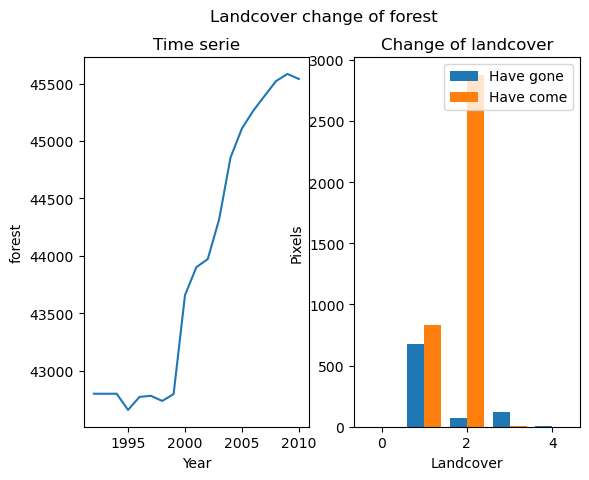

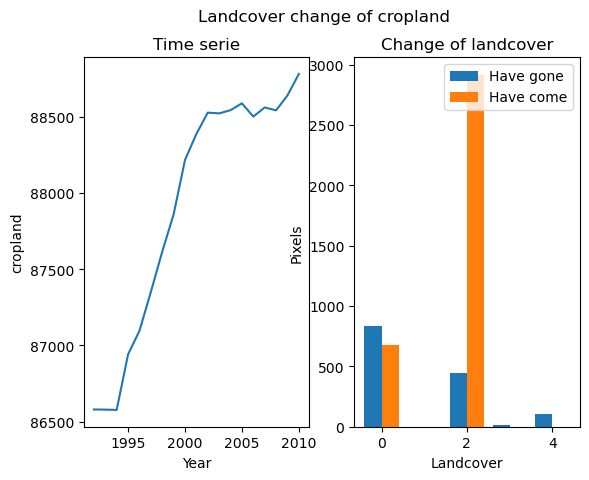

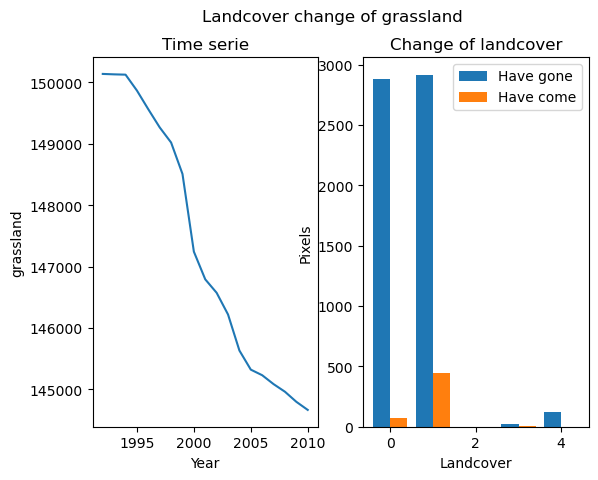

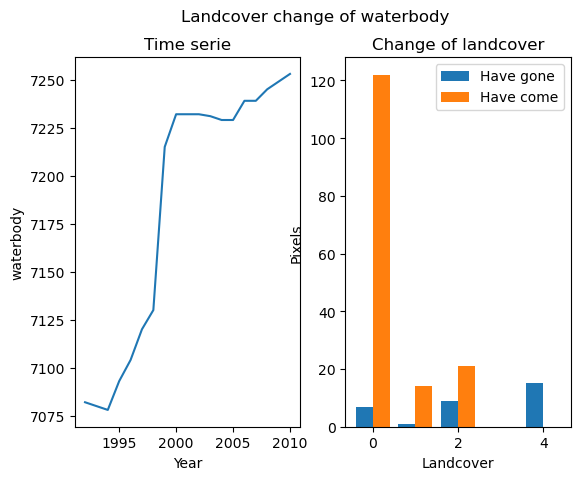

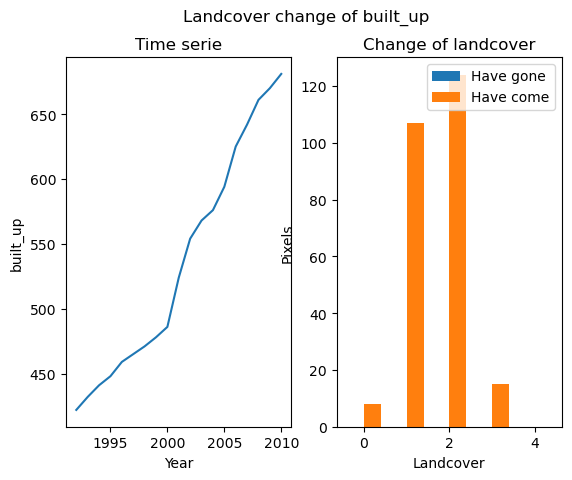

En la posicion (435,112) ha cambiado de forest a waterbody
En la posicion (435,113) ha cambiado de forest a waterbody
En la posicion (454,220) ha cambiado de forest a waterbody
En la posicion (448,225) ha cambiado de forest a waterbody
En la posicion (453,200) ha cambiado de forest a waterbody
En la posicion (454,200) ha cambiado de forest a waterbody
En la posicion (454,202) ha cambiado de forest a waterbody
En la posicion (454,205) ha cambiado de forest a waterbody
En la posicion (455,207) ha cambiado de forest a waterbody
En la posicion (455,208) ha cambiado de forest a waterbody
En la posicion (457,217) ha cambiado de forest a waterbody
En la posicion (396,438) ha cambiado de cropland a waterbody
En la posicion (431,226) ha cambiado de forest a waterbody
En la posicion (443,224) ha cambiado de forest a waterbody
En la posicion (453,204) ha cambiado de forest a waterbody
En la posicion (455,219) ha cambiado de forest a waterbody
En la posicion (457,149) ha cambiado de forest a water

In [25]:
from illogical_changes import main as illogical
ilpo=illogical(modis_stack, change_map, years, etiqueta2)

In [26]:
print(len(ilpo))#there are 164 illogical transformations

164


In [27]:
import pandas as pd

In [44]:
df = pd.read_csv("information.csv")
feature_names = ['NDVI', 'Drought', 'Elevation', 'DSMP']
label = "Landcover"
X = df[feature_names]
print(X)

         NDVI  Drought  Elevation      DSMP
0       0.000      0.0        4.0  3.665855
1       0.000      0.0        6.0  4.006185
2       0.000      0.0        6.0  4.028295
3       0.128      0.0        1.0  3.875121
4       0.116      0.0       -2.0  1.159406
...       ...      ...        ...       ...
278417  0.520      0.0      165.0  9.039271
278418  0.476      0.0      274.0  6.844800
278419  0.496      0.0      423.0  5.715017
278420  0.512      0.0      528.0  6.998850
278421  0.516      0.0      531.0  7.805655

[278422 rows x 4 columns]


In [47]:
X_illo=[["NDVI","Drought","Elevation","DSMP"]]
for i in range(len(ilpo)):
    r=[]
    if math.isnan(float(modis_stack_NDVI[years.index(ilpo[i][0])][0,ilpo[i][1],ilpo[i][2]]))==False:
        r.append(modis_stack_NDVI[years.index(ilpo[i][0])][0,ilpo[i][1],ilpo[i][2]])
    if math.isnan(float(modis_stack_NDVI[years.index(ilpo[i][0])][0,ilpo[i][1],ilpo[i][2]]))==True:
        r.append(0)
    r.append(modis_stack_drought[years.index(ilpo[i][0])][0,ilpo[i][1],ilpo[i][2]])
    r.append(modis_stack_elevation[0,ilpo[i][1],ilpo[i][2]])
    r.append(modis_stack_DSMP[years.index(ilpo[i][0])][0,ilpo[i][1],ilpo[i][2]])
    X_illo.append(r)

nombres_columnas = X_illo[0]

X_illo = pd.DataFrame(X_illo[1:], columns=nombres_columnas)
print(X_illo)


Y=rf.predict(X_illo)


      NDVI  Drought  Elevation      DSMP
0    0.256      0.0        3.0  0.000000
1    0.300      0.0        2.0  0.063929
2    0.328      0.0        3.0  0.000000
3    0.380      0.0        2.0  5.939346
4    0.276      0.0        0.0  0.980780
..     ...      ...        ...       ...
159  0.000      0.0       14.0  0.494368
160  0.000      0.0       13.0  0.068808
161  0.000      0.0       15.0  4.126011
162  0.000      0.0       13.0  0.460773
163  0.340      0.0        4.0  0.481452

[164 rows x 4 columns]


We rewrite the values of the landcover, but if it is a illogical position, we change it with the value of Y

In [40]:
num_iltra=0
for i in ilpo:
    if modis_stack[years.index(i[0])][0,i[1],i[2]]!=Y[ilpo.index(i)]:
        num_iltra+=1
        print("De "+str(modis_stack[years.index(i[0])][0,i[1],i[2]])+"ha pasado a "+str(Y[ilpo.index(i)])+"en el año "+str(i[0])+", en el siguiente es "+str(modis_stack[years.index(i[0])+1][0,i[1],i[2]])+"en la posicion ("+str(i[1])+","+str(i[2])+")")
print(num_iltra)
                

De 1ha pasado a 4en el año 1994, en el siguiente es 4en la posicion (435,112)
De 1ha pasado a 4en el año 1994, en el siguiente es 4en la posicion (435,113)
De 1ha pasado a 4en el año 1994, en el siguiente es 4en la posicion (454,220)
De 1ha pasado a 2en el año 1995, en el siguiente es 4en la posicion (453,200)
De 1ha pasado a 4en el año 1995, en el siguiente es 4en la posicion (454,200)
De 1ha pasado a 4en el año 1995, en el siguiente es 4en la posicion (454,202)
De 1ha pasado a 4en el año 1995, en el siguiente es 4en la posicion (454,205)
De 1ha pasado a 3en el año 1995, en el siguiente es 4en la posicion (455,207)
De 1ha pasado a 4en el año 1995, en el siguiente es 4en la posicion (455,208)
De 1ha pasado a 2en el año 1995, en el siguiente es 4en la posicion (457,217)
De 3ha pasado a 1en el año 1996, en el siguiente es 4en la posicion (396,438)
De 1ha pasado a 4en el año 1996, en el siguiente es 4en la posicion (431,226)
De 1ha pasado a 4en el año 1996, en el siguiente es 4en la posic

There has been 102 changes

In [52]:
modis_stack_final=modis_stack
for i in ilpo:
    modis_stack_final[years.index(i[0])][0,i[1],i[2]]=Y[ilpo.index(i)]

We see if we still containing illogical changes

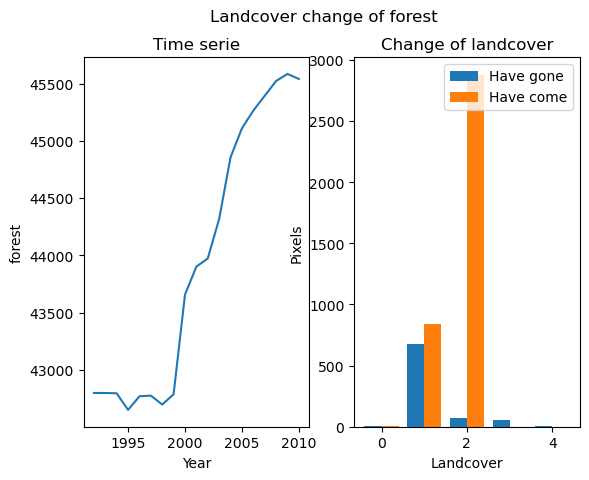

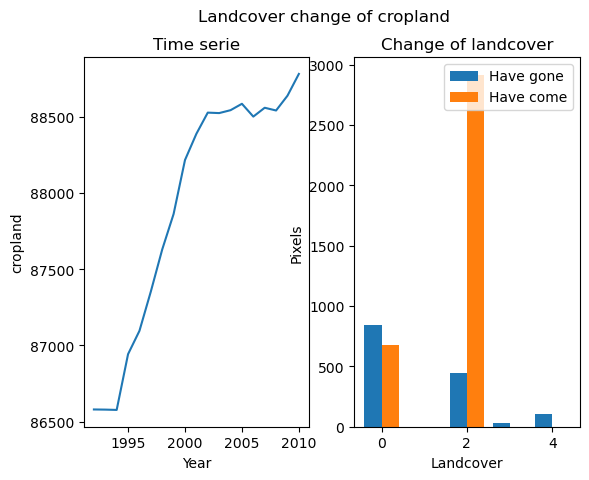

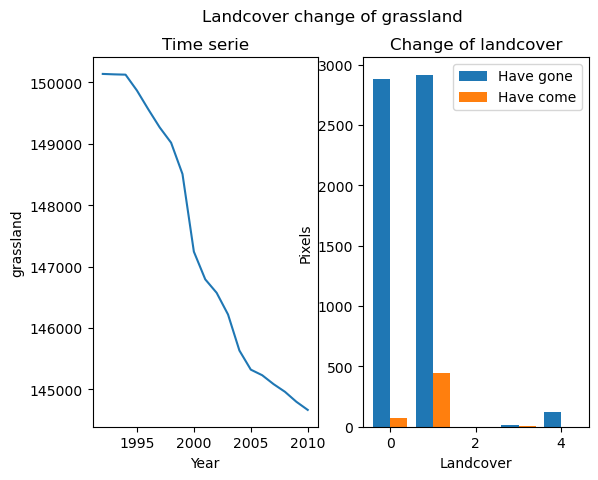

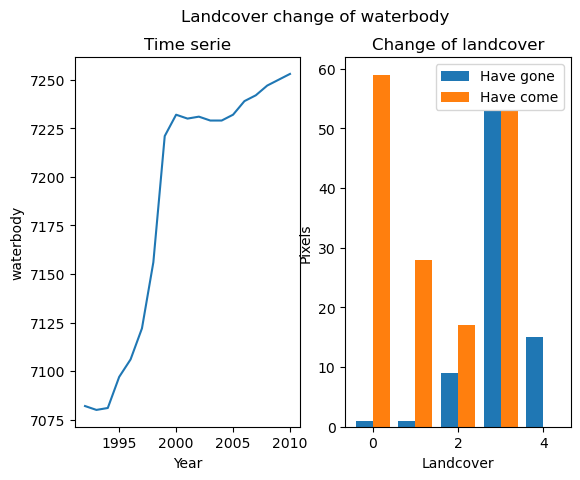

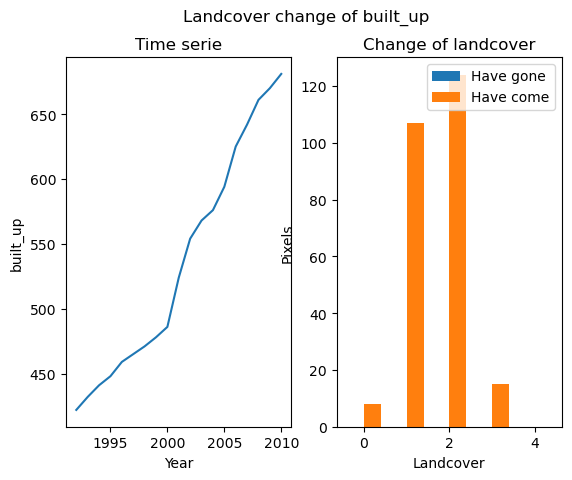

En la posicion (435,112) ha cambiado de forest a waterbody
En la posicion (435,113) ha cambiado de forest a waterbody
En la posicion (454,220) ha cambiado de forest a waterbody
En la posicion (454,200) ha cambiado de forest a waterbody
En la posicion (454,202) ha cambiado de forest a waterbody
En la posicion (454,205) ha cambiado de forest a waterbody
En la posicion (455,208) ha cambiado de forest a waterbody
En la posicion (431,226) ha cambiado de forest a waterbody
En la posicion (448,225) ha cambiado de forest a waterbody
En la posicion (453,200) ha cambiado de grassland a waterbody
En la posicion (453,204) ha cambiado de forest a waterbody
En la posicion (455,207) ha cambiado de cropland a waterbody
En la posicion (457,217) ha cambiado de grassland a waterbody
En la posicion (396,438) ha cambiado de forest a waterbody
En la posicion (443,224) ha cambiado de forest a waterbody
En la posicion (455,203) ha cambiado de forest a waterbody
En la posicion (455,219) ha cambiado de forest a

In [53]:
from illogical_changes import main as illogical
ilpo=illogical(modis_stack_final, change_map, years, etiqueta2)

In [54]:
num_iltra=0
for i in ilpo:
    if modis_stack[years.index(i[0])][0,i[1],i[2]]!=Y[ilpo.index(i)]:
        num_iltra+=1
        print("De "+str(modis_stack[years.index(i[0])][0,i[1],i[2]])+"ha pasado a "+str(Y[ilpo.index(i)])+"en el año "+str(i[0])+", en el siguiente es "+str(modis_stack[years.index(i[0])+1][0,i[1],i[2]])+"en la posicion ("+str(i[1])+","+str(i[2])+")")
print(num_iltra)

De 1ha pasado a 4en el año 1993, en el siguiente es 4en la posicion (435,112)
De 1ha pasado a 4en el año 1993, en el siguiente es 4en la posicion (435,113)
De 1ha pasado a 4en el año 1993, en el siguiente es 4en la posicion (454,220)
De 1ha pasado a 2en el año 1994, en el siguiente es 4en la posicion (454,202)
De 1ha pasado a 4en el año 1994, en el siguiente es 4en la posicion (454,205)
De 1ha pasado a 4en el año 1994, en el siguiente es 4en la posicion (455,208)
De 1ha pasado a 4en el año 1995, en el siguiente es 4en la posicion (431,226)
De 1ha pasado a 3en el año 1995, en el siguiente es 4en la posicion (448,225)
De 2ha pasado a 4en el año 1995, en el siguiente es 4en la posicion (453,200)
De 1ha pasado a 2en el año 1995, en el siguiente es 4en la posicion (453,204)
De 3ha pasado a 1en el año 1995, en el siguiente es 4en la posicion (455,207)
De 2ha pasado a 4en el año 1995, en el siguiente es 4en la posicion (457,217)
De 1ha pasado a 4en el año 1996, en el siguiente es 4en la posic

Super useless, we still containing illogical transformations, before we had 164 illogical transformations and now we have 160

In [31]:
from cosa import main as ReductionIllogical

modis_stack_final=ReductionIllogical(rf, years, modis_stack, modis_stack_NDVI, modis_stack_drought, modis_stack_elevation, modis_stack_DSMP)

There are160 illogical positions
There are159 illogical positions
There are158 illogical positions
There are155 illogical positions
There are154 illogical positions
There are153 illogical positions
There are145 illogical positions
There are144 illogical positions
There are144 illogical positions
There are143 illogical positions
There are143 illogical positions
There are143 illogical positions
There are143 illogical positions
There are143 illogical positions
There are143 illogical positions
There are143 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are141 illogical positions
There are1

KeyboardInterrupt: 